In [31]:
import os

In [1]:
#from IPython.core.interactiveshell import InteractiveShell
#InteractiveShell.ast_node_interactivity = 'all'

#pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', 50)

In [2]:
from tqdm import tqdm

In [3]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

In [4]:
from sklearn.preprocessing import LabelEncoder

from sktime.distances import distance
from sktime.transformations.panel.dictionary_based import PAAlegacy as PAA

In [5]:
from sktime.transformations.series.adapt import TabularToSeriesAdaptor
from sklearn.preprocessing import StandardScaler

In [6]:
def load_npy(filename):
    with open(filename, 'rb') as f:
        return np.load(f)

In [7]:
colors = ['#ae0c1b', '#015697', '#4f845c']

In [29]:
dir_path = '/Users/shtk/DM PRJ 2/time_series/'
len_threshold = 1280

In [1]:
import numpy as np

In [34]:
X, y, ids = [], [], []

for file in os.listdir(dir_path):
    if os.path.splitext(file)[1] != '.npy':
        continue

    split = file.split("_")
    ids.append(split[0]) # track_id
    y.append(split[1][:-4]) # genre
    ts = load_npy(dir_path + file)
    
    if len(ts) > len_threshold:
        ts = ts[0:len_threshold]
    else:
        # pad = [np.mean(ts[:-5])] * (len_threshold-len(ts)) # fill by mean value of last n observations
        pad = [ts[-1]] * (len_threshold-len(ts)) # fill with last observation
        ts = np.append(ts, pad) 

    X.append(ts)

#X, y, ids = np.array(X), np.array(y), np.array(ids)

In [35]:
#ts = pd.DataFrame(X)
#df = ts.copy()
df = pd.DataFrame(X)
df['genre'] = y
df['genre_en'] = LabelEncoder().fit_transform(df['genre'])

In [36]:
ts = pd.DataFrame(X)

In [37]:
df.describe()

,0,1,2,3,4,5,6,7,8,9,...,1271,1272,1273,1274,1275,1276,1277,1278,1279,genre_en
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,...,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000
mean,2088.899296,2097.541521,2107.677689,2093.359658,2101.328996,2127.455135,2149.235466,2149.443864,2144.197654,2166.458569,...,2151.231930,2144.274505,2133.890728,2120.728707,2121.117429,2133.214184,2142.786078,2114.333864,2047.763738,9.50000
std,919.082669,920.221771,931.273040,945.904140,964.561212,973.428317,977.706395,980.031469,980.471509,979.240888,...,1033.798084,1029.813438,1021.437516,1008.492385,1009.514131,1015.730880,1023.477777,1021.836679,1015.122773,5.76657
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
25%,1460.566329,1462.912733,1459.429214,1419.174012,1410.189210,1426.726086,1463.249572,1463.627611,1464.089226,1489.060020,...,1423.642849,1415.706534,1406.824088,1401.013479,1395.590057,1400.918098,1408.180246,1382.225521,1304.921733,4.75000
50%,2087.432583,2095.824617,2106.400716,2081.994282,2082.871917,2108.487497,2146.190351,2149.558887,2129.666235,2154.331953,...,2127.170274,2114.977168,2109.983676,2107.549432,2107.747499,2119.923482,2122.418323,2080.700640,2003.549305,9.50000
75%,2684.738324,2688.913381,2726.276756,2723.176231,2724.638132,2756.290680,2789.308406,2783.122230,2764.819190,2779.148747,...,2780.699640,2778.639315,2763.217859,2748.790752,2753.517077,2770.604381,2779.446660,2750.287869,2666.579529,14.25000
max,8121.858964,8050.881901,7816.026323,7431.098498,7282.628953,7104.967570,7011.074341,6955.676362,7076.525400,7180.547688,...,7775.960055,8064.994752,7954.447550,7055.635750,7264.327658,7280.543301,7725.208624,7739.289713,7354.363784,19.00000


In [38]:
df = pd.DataFrame(X)
df['genre'] = y
df

,0,1,2,3,4,5,6,7,8,9,...,1271,1272,1273,1274,1275,1276,1277,1278,1279,genre
0,768.953928,828.022584,941.386304,945.749554,1159.725465,1240.333451,1423.674344,1634.191655,1828.503961,1847.519588,...,1340.313921,1279.665800,1360.056734,1444.307480,1517.640273,1458.297057,1442.914786,1391.236018,1321.283908,opera
1,3230.211119,3344.520081,3136.686050,2845.915331,2808.156723,2651.146880,2495.342218,2549.019959,2661.295847,2727.635261,...,2694.619211,3191.035809,2830.924961,2308.329541,1724.827512,1325.563666,1130.380398,978.286919,899.698980,minimal-techno
2,2192.694219,1986.904857,2082.598864,2254.738538,2401.683572,2407.616566,2217.455236,2091.153692,1957.757435,1862.646861,...,3025.026862,3222.103029,3303.188014,3347.910378,3343.393614,3378.469131,3533.683709,3432.652557,3476.442086,goth
3,1050.270174,1122.238261,1176.087855,1132.076020,1099.776970,1044.397110,1017.142440,1071.410733,1101.055515,1114.730346,...,877.321930,859.559805,802.391176,798.260556,753.313485,770.064609,804.954898,839.047077,851.398559,opera
4,2467.430056,2222.344861,2053.680022,1733.958104,1115.226422,821.548505,964.249252,1550.314474,2235.348186,2176.156140,...,763.993678,1417.110211,1939.536578,1798.345901,1245.512644,1079.249670,1005.486618,926.054992,964.566937,minimal-techno
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2548.124862,2546.788233,2649.905705,2659.042892,2739.511966,2733.944363,2880.998890,2981.835024,3166.374133,3280.319527,...,3029.181437,2885.266212,2740.819521,2545.461249,2638.891888,2936.289554,2917.328360,2730.350407,2609.564983,sleep
9996,2228.440176,2254.232821,2708.213067,2628.270963,2435.534537,2608.498513,2880.992403,3051.814048,2945.827688,2689.657712,...,2323.393471,2266.863656,2222.550753,2289.493743,2308.147315,2370.018721,2399.885699,2172.397959,2040.035946,songwriter
9997,2744.444167,2714.723088,2696.453246,2946.824085,3290.350700,3590.748661,3391.136867,2875.449961,3000.725993,3341.052924,...,6206.808889,5680.641287,3864.233246,3679.890839,3784.591377,3828.972870,3747.162877,3684.384552,3837.186219,kids
9998,1679.191508,1371.382114,1276.830645,1667.736417,1932.889145,1889.347707,1701.279505,1684.952873,1677.765190,1429.459174,...,2954.189607,2065.144493,2008.085378,1958.001344,1771.220881,1758.607273,1590.939027,1215.853836,1044.419647,kids


In [39]:
df['genre_en'] = LabelEncoder().fit_transform(df['genre'])

In [20]:
def sample_genre_rows(df, n=3):
    return df.groupby('genre').apply(lambda x: x.sample(n)).reset_index(drop=True)

# Sample 3 rows for each genre 4, 11, and 16
#df_sampled = sample_genre_rows(df, 3)

In [21]:
sampled = sample_genre_rows(df, n=50)

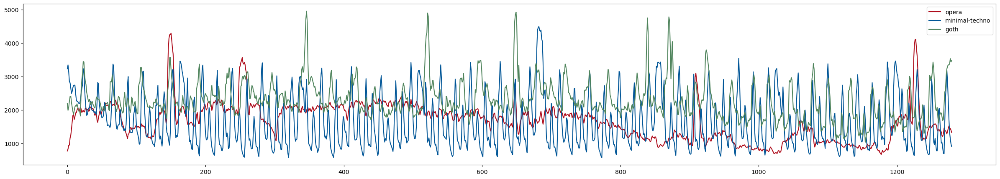

In [33]:
colors = ['#ae0c1b', '#015697', '#4f845c']

plt.figure(figsize=(30, 5))
for i in range(3):
    plt.plot(df.iloc[i, :-1], label=f'{df.iloc[i, -1]}' , c=colors[i])
plt.legend()
plt.show()

In [16]:
def plot(ts_list, n, title, labels=None, figsize=(30, 8)):
     
    c=['#ae0c1b','#015697',  '#4f845c']
    plt.figure(figsize=figsize)
    
    for idx, ts in enumerate(ts_list):
        for i in range(n):
            plt.plot(ts.iloc[i], label=(labels[idx] if labels else None), c=c[idx])
    
    if labels:
        plt.legend()
    
    plt.title(title)
    plt.show()


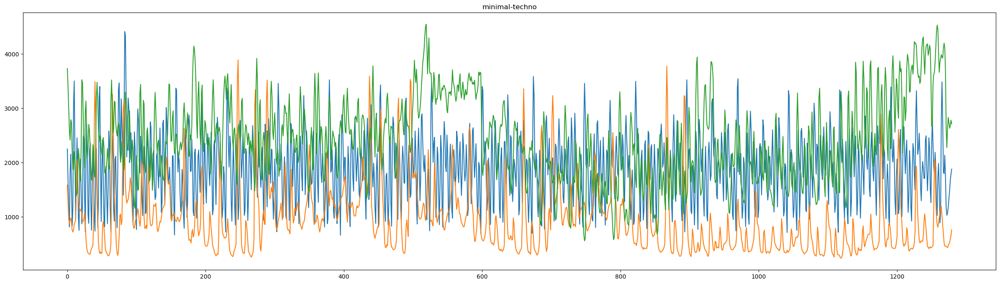

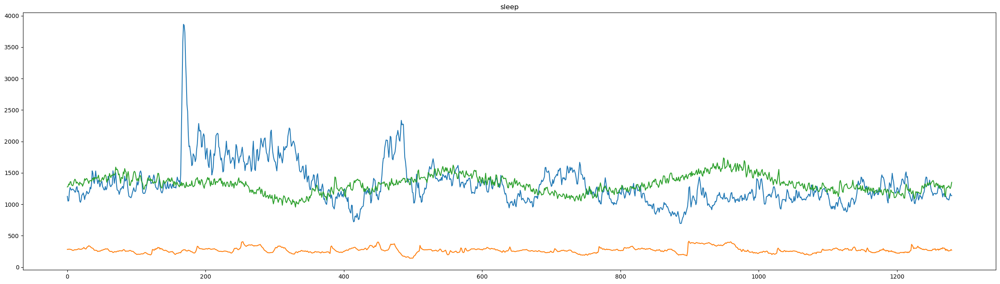

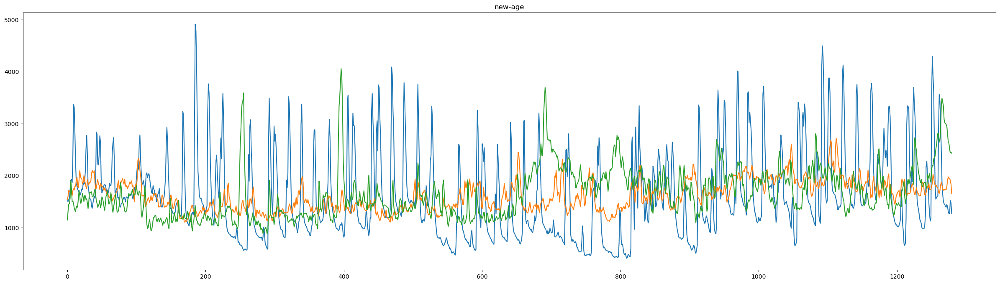

In [602]:
ts = df_sampled[df_sampled['genre']==8].iloc[:, :-1]
plot([ts], 3, 'minimal-techno')


ts = df_sampled[df_sampled['genre']==16].iloc[:, :-1]
plot([ts], 3, 'sleep')

ts = df_sampled[df_sampled['genre']==10].iloc[:, :-1]
plot([ts], 3, 'new-age')

## Transformation

In [12]:
def transform(data, scalar):
    scaled_data = pd.DataFrame(scaler.fit_transform(data))
    return scaled_data

### offset transformation

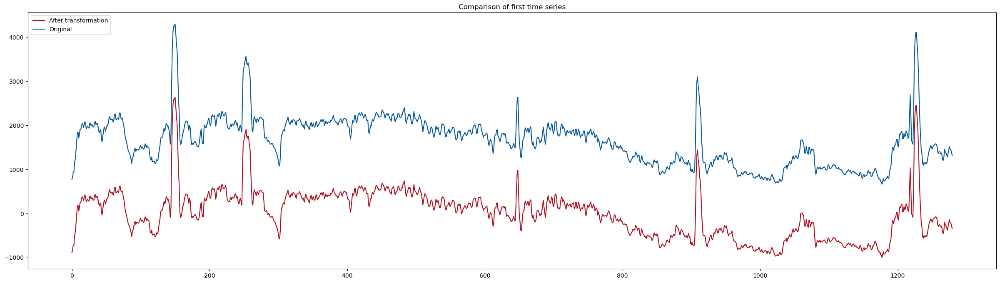

In [17]:
scaler = TabularToSeriesAdaptor(StandardScaler(with_std=False))
scaled_data = transform(df.iloc[:, :-2].T.values, scaler)

plot([scaled_data.T, df.iloc[:, :-2]], 1, 'Comparison of first time series',labels=['After transformation', 'Original'])

In [18]:
shtkoffset_ts = scaled_data.T
offset_ts['genre'] = df['genre']
offset_ts['genre_en'] = df['genre_en']
offset_ts

,0,1,2,3,4,5,6,7,8,9,...,1272,1273,1274,1275,1276,1277,1278,1279,genre,genre_en
0,-889.312934,-830.244278,-716.880558,-712.517308,-498.541397,-417.933411,-234.592519,-24.075207,170.237099,189.252726,...,-378.601063,-298.210128,-213.959382,-140.626589,-199.969805,-215.352076,-267.030844,-336.982954,opera,11
1,1560.956897,1675.265859,1467.431828,1176.661109,1138.902501,981.892658,826.087996,879.765737,992.041625,1058.381039,...,1521.781587,1161.670739,639.075319,55.573290,-343.690556,-538.873824,-690.967302,-769.555242,minimal-techno,8
2,-82.869183,-288.658545,-192.964538,-20.824864,126.120170,132.053164,-58.108166,-184.409710,-317.805967,-412.916541,...,946.539627,1027.624612,1072.346976,1067.830212,1102.905729,1258.120307,1157.089155,1200.878684,goth,2
3,-322.830984,-250.862897,-197.013303,-241.025138,-273.324188,-328.704048,-355.958718,-301.690425,-272.045643,-258.370812,...,-513.541353,-570.709982,-574.840602,-619.787673,-603.036549,-568.146260,-534.054081,-521.702599,opera,11
4,789.698219,544.613023,375.948184,56.226266,-562.505416,-856.183333,-713.482586,-127.417364,557.616348,498.424302,...,-260.621627,261.804740,120.614064,-432.219193,-598.482168,-672.245220,-751.676846,-713.164901,minimal-techno,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-316.906612,-318.243241,-215.125769,-205.988582,-125.519508,-131.087111,15.967416,116.803550,301.342659,415.288054,...,20.234738,-124.211953,-319.570225,-226.139585,71.258080,52.296886,-134.681066,-255.466490,sleep,16
9996,-196.212434,-170.419789,283.560457,203.618354,10.881928,183.845903,456.339793,627.161439,521.175079,265.005102,...,-157.788953,-202.101856,-135.158867,-116.505295,-54.633889,-24.766910,-252.254650,-384.616664,songwriter,17
9997,-63.533599,-93.254677,-111.524519,138.846320,482.372935,782.770896,583.159102,67.472196,192.748227,533.075159,...,2872.663521,1056.255481,871.913074,976.613611,1020.995105,939.185111,876.406787,1029.208453,kids,7
9998,-1230.389766,-1538.199160,-1632.750629,-1241.844857,-976.692129,-1020.233568,-1208.301769,-1224.628401,-1231.816084,-1480.122100,...,-844.436781,-901.495896,-951.579930,-1138.360393,-1150.974001,-1318.642247,-1693.727438,-1865.161627,kids,7


### amplitude scaling

In [31]:
offset_ts

,0,1,2,3,4,5,6,7,8,9,...,1272,1273,1274,1275,1276,1277,1278,1279,genre,genre_en
0,-889.312934,-830.244278,-716.880558,-712.517308,-498.541397,-417.933411,-234.592519,-24.075207,170.237099,189.252726,...,-378.601063,-298.210128,-213.959382,-140.626589,-199.969805,-215.352076,-267.030844,-336.982954,opera,11
1,1560.956897,1675.265859,1467.431828,1176.661109,1138.902501,981.892658,826.087996,879.765737,992.041625,1058.381039,...,1521.781587,1161.670739,639.075319,55.573290,-343.690556,-538.873824,-690.967302,-769.555242,minimal-techno,8
2,-82.869183,-288.658545,-192.964538,-20.824864,126.120170,132.053164,-58.108166,-184.409710,-317.805967,-412.916541,...,946.539627,1027.624612,1072.346976,1067.830212,1102.905729,1258.120307,1157.089155,1200.878684,goth,2
3,-322.830984,-250.862897,-197.013303,-241.025138,-273.324188,-328.704048,-355.958718,-301.690425,-272.045643,-258.370812,...,-513.541353,-570.709982,-574.840602,-619.787673,-603.036549,-568.146260,-534.054081,-521.702599,opera,11
4,789.698219,544.613023,375.948184,56.226266,-562.505416,-856.183333,-713.482586,-127.417364,557.616348,498.424302,...,-260.621627,261.804740,120.614064,-432.219193,-598.482168,-672.245220,-751.676846,-713.164901,minimal-techno,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-316.906612,-318.243241,-215.125769,-205.988582,-125.519508,-131.087111,15.967416,116.803550,301.342659,415.288054,...,20.234738,-124.211953,-319.570225,-226.139585,71.258080,52.296886,-134.681066,-255.466490,sleep,16
9996,-196.212434,-170.419789,283.560457,203.618354,10.881928,183.845903,456.339793,627.161439,521.175079,265.005102,...,-157.788953,-202.101856,-135.158867,-116.505295,-54.633889,-24.766910,-252.254650,-384.616664,songwriter,17
9997,-63.533599,-93.254677,-111.524519,138.846320,482.372935,782.770896,583.159102,67.472196,192.748227,533.075159,...,2872.663521,1056.255481,871.913074,976.613611,1020.995105,939.185111,876.406787,1029.208453,kids,7
9998,-1230.389766,-1538.199160,-1632.750629,-1241.844857,-976.692129,-1020.233568,-1208.301769,-1224.628401,-1231.816084,-1480.122100,...,-844.436781,-901.495896,-951.579930,-1138.360393,-1150.974001,-1318.642247,-1693.727438,-1865.161627,kids,7


In [47]:
scaler = TabularToSeriesAdaptor(StandardScaler())
scaled_data = transform(df.iloc[:, :-1].T.values, scaler)

In [23]:
scaler = TabularToSeriesAdaptor(StandardScaler())
scaled_data = transform(df.iloc[:, :-2].T.values, scaler)

plot([scaled_data.T], 1, 'After amplitude scaling')
plot([offset_ts.iloc[:, :-2]], 1, 'After offset transformation')

NameError: name 'plot' is not defined

In [44]:
df

,0,1,2,3,4,5,6,7,8,9,...,1271,1272,1273,1274,1275,1276,1277,1278,1279,genre
0,768.953928,828.022584,941.386304,945.749554,1159.725465,1240.333451,1423.674344,1634.191655,1828.503961,1847.519588,...,1340.313921,1279.665800,1360.056734,1444.307480,1517.640273,1458.297057,1442.914786,1391.236018,1321.283908,opera
1,3230.211119,3344.520081,3136.686050,2845.915331,2808.156723,2651.146880,2495.342218,2549.019959,2661.295847,2727.635261,...,2694.619211,3191.035809,2830.924961,2308.329541,1724.827512,1325.563666,1130.380398,978.286919,899.698980,minimal-techno
2,2192.694219,1986.904857,2082.598864,2254.738538,2401.683572,2407.616566,2217.455236,2091.153692,1957.757435,1862.646861,...,3025.026862,3222.103029,3303.188014,3347.910378,3343.393614,3378.469131,3533.683709,3432.652557,3476.442086,goth
3,1050.270174,1122.238261,1176.087855,1132.076020,1099.776970,1044.397110,1017.142440,1071.410733,1101.055515,1114.730346,...,877.321930,859.559805,802.391176,798.260556,753.313485,770.064609,804.954898,839.047077,851.398559,opera
4,2467.430056,2222.344861,2053.680022,1733.958104,1115.226422,821.548505,964.249252,1550.314474,2235.348186,2176.156140,...,763.993678,1417.110211,1939.536578,1798.345901,1245.512644,1079.249670,1005.486618,926.054992,964.566937,minimal-techno
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2548.124862,2546.788233,2649.905705,2659.042892,2739.511966,2733.944363,2880.998890,2981.835024,3166.374133,3280.319527,...,3029.181437,2885.266212,2740.819521,2545.461249,2638.891888,2936.289554,2917.328360,2730.350407,2609.564983,sleep
9996,2228.440176,2254.232821,2708.213067,2628.270963,2435.534537,2608.498513,2880.992403,3051.814048,2945.827688,2689.657712,...,2323.393471,2266.863656,2222.550753,2289.493743,2308.147315,2370.018721,2399.885699,2172.397959,2040.035946,songwriter
9997,2744.444167,2714.723088,2696.453246,2946.824085,3290.350700,3590.748661,3391.136867,2875.449961,3000.725993,3341.052924,...,6206.808889,5680.641287,3864.233246,3679.890839,3784.591377,3828.972870,3747.162877,3684.384552,3837.186219,kids
9998,1679.191508,1371.382114,1276.830645,1667.736417,1932.889145,1889.347707,1701.279505,1684.952873,1677.765190,1429.459174,...,2954.189607,2065.144493,2008.085378,1958.001344,1771.220881,1758.607273,1590.939027,1215.853836,1044.419647,kids


In [14]:
scaler = TabularToSeriesAdaptor(StandardScaler())
scaled_data = transform(approx_paa.iloc[:, :-1].T.values, scaler)

amp_ts = scaled_data.T
amp_ts['genre'] = approx_paa['genre']

amp_ts

,0,1,2,3,4,5,6,7,8,9,...,151,152,153,154,155,156,157,158,159,genre
0,-1.042847,0.427075,0.650335,0.647064,0.685069,0.302316,0.699174,0.956786,1.011829,0.544741,...,0.235919,0.625582,3.773687,-0.491320,-0.723356,-0.239832,-0.449502,-0.638292,-0.494577,opera
1,2.409949,1.691929,1.654409,1.122494,0.760108,1.112047,0.511975,-0.127037,1.545935,-0.044130,...,-0.881695,-0.625066,0.856130,-0.382141,-1.494207,0.184847,-0.631160,-0.590908,0.256963,minimal-techno
2,-0.159411,-0.502561,0.437025,0.943825,-0.184838,0.006581,-0.506155,0.060174,0.390827,-0.184063,...,-1.499274,0.374003,-1.287323,-1.190117,-1.152865,1.540194,-0.896239,-0.224803,2.471866,goth
3,-0.995950,-0.758811,-1.201981,-1.785860,-1.425275,-0.634662,-0.722934,-0.155026,-0.052947,0.547541,...,-2.216091,-2.481857,-1.969815,-1.329345,-1.449848,-1.630017,-1.727395,-1.668355,-1.975677,opera
4,-0.170043,0.550775,0.443144,0.300635,-1.064374,1.587161,0.863917,-0.404727,-1.172712,0.151762,...,0.204205,-2.134049,0.374249,-1.127607,0.351395,-1.432630,-0.519631,-0.352843,-1.050390,minimal-techno
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-1.340387,-0.087108,0.218244,0.192000,2.960032,1.215727,0.107905,-0.045041,-0.947650,-2.005580,...,-1.152477,3.030239,-0.384958,-0.044914,-0.817940,-1.349367,-0.700077,-0.559948,-1.040733,sleep
9996,0.391612,0.860319,0.577552,1.527014,0.301348,1.421388,0.363853,-0.155052,0.061756,-0.670033,...,-0.326378,0.132117,-1.948573,-1.904103,-0.815838,-0.106775,-0.290252,-0.127551,-0.371749,songwriter
9997,0.232772,1.354768,2.242706,0.891199,1.046958,-0.802661,-0.143046,-0.531068,-0.254404,0.075536,...,1.277131,0.831498,-0.157613,0.379807,0.581979,1.020739,0.557693,2.135951,1.256600,kids
9998,-1.194377,-0.419691,-0.514673,-0.683088,-1.063809,-0.030487,-0.775623,-0.523629,-0.483376,-1.162803,...,0.595164,1.197811,2.084210,0.772865,-0.268427,0.042416,0.305677,0.632643,-1.169636,kids


In [27]:
scaler = TabularToSeriesAdaptor(StandardScaler())
scaled_data = transform(sampled.iloc[:, :-2].T.values, scaler)

amp_ts_s = scaled_data.T
amp_ts_s['genre'] = sampled['genre']
amp_ts_s['genre_en'] = sampled['genre_en']
amp_ts_s

,0,1,2,3,4,5,6,7,8,9,...,1272,1273,1274,1275,1276,1277,1278,1279,genre,genre_en
0,-0.618140,-0.553992,-0.530440,-0.613324,-0.784672,-1.036723,-1.158929,-0.948337,-0.302046,1.549231,...,1.922062,1.383126,2.419042,2.280183,1.241365,2.319292,2.610450,2.326859,emo,0
1,-0.117120,0.233241,1.930864,2.664730,0.854010,0.271688,0.396341,0.389858,0.360078,0.347765,...,-0.625915,-0.564671,-0.620079,-0.688608,-0.701063,-0.862967,-0.865234,-0.882839,emo,0
2,0.682372,0.310689,-0.046302,-0.450823,-0.485413,-0.011484,0.160309,0.923646,1.359902,-0.127201,...,-1.081621,-1.067794,-1.072214,-1.017243,-0.904828,-0.869539,-1.199857,-1.523175,emo,0
3,-0.511042,-0.593132,-0.584979,-0.711717,-1.105045,-1.325063,-1.406671,-1.310425,-1.058031,0.362307,...,1.097015,0.913891,0.603631,0.520467,0.203611,-0.264680,-0.876550,-1.373018,emo,0
4,-1.109368,-1.460422,-1.070099,-0.630301,-0.506698,-0.394215,-0.474990,-0.318402,-0.113197,-0.393337,...,-0.191563,-2.433913,-3.856695,-3.694444,-3.705564,-3.788146,-3.955814,-3.501815,emo,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,-0.812081,-0.695088,-0.698372,-0.672382,-0.452823,-0.785269,-0.996097,-1.052911,-1.046598,-1.073798,...,-2.465150,-2.635842,-2.796153,-2.728825,-2.495635,-2.748093,-2.891389,-2.891258,world-music,19
996,1.024171,1.114629,0.899828,0.613465,0.446851,1.396621,3.357142,4.441351,4.071138,3.280873,...,0.084436,0.281595,0.398763,0.363027,0.318219,0.328250,0.156305,0.117791,world-music,19
997,-0.882635,-0.500890,-0.424042,-0.198123,-0.093271,-0.752963,-1.172030,-1.271359,-1.728724,-1.849760,...,-0.354180,-0.440819,-0.604174,-0.724200,-0.538442,-0.333841,-0.018484,0.148016,world-music,19
998,-0.598522,-0.599187,-0.860639,-1.212418,-1.174723,-1.140493,-1.127277,-1.080789,-0.982836,-0.917148,...,-0.947481,-0.722332,-0.572026,-0.223636,0.117403,0.520336,0.841545,0.901444,world-music,19


In [24]:
def plot(ts_list, n, title, labels=None, figsize=(30, 8)):
     
    c=['#4f845c', '#ae0c1b','#015697']
    plt.figure(figsize=figsize)
    
    for idx, ts in enumerate(ts_list):
        for i in range(n):
            plt.plot(ts.iloc[i], label=(labels[idx] if labels else None), c=c[i])
    
    if labels:
        plt.legend()
    
    plt.title(title)
    plt.show()

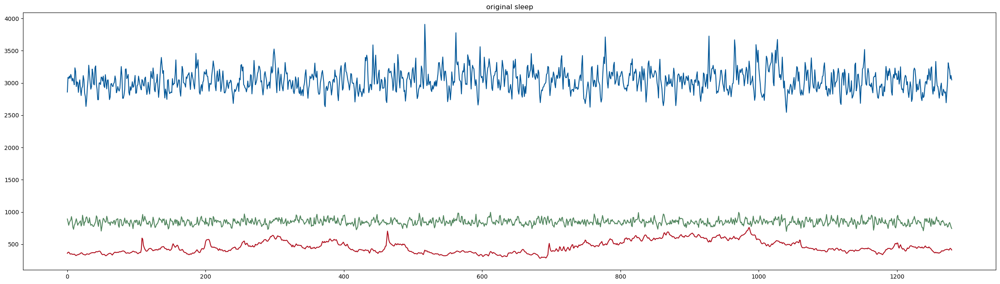

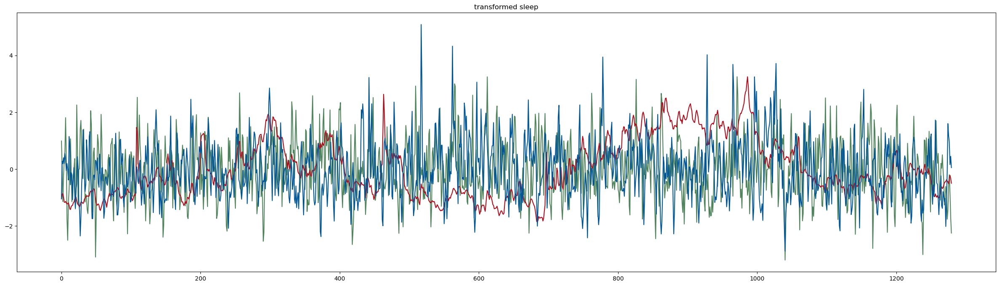

In [25]:
plot([df[df['genre_en'] == 16].iloc[:, :-2]], 3, 'original sleep')
plot([amp_offset_ts[amp_offset_ts['genre_en'] == 16].iloc[:, :-2]], 3, 'transformed sleep')

### approx clustering (DFT)

In [16]:
from sklearn.metrics import silhouette_score 
from scipy.spatial.distance import pdist, squareform
from sktime.clustering.k_means import TimeSeriesKMeans
from sktime.utils.plotting import plot_series

In [37]:
from pyts.approximation import DiscreteFourierTransform

In [38]:
# code derived from https://pyts.readthedocs.io/en/stable/auto_examples/approximation/plot_dft.html
def dft_inverse_trasform(X_dft, n_coefs, n_timestamps):
    # Compute the inverse transformation
    n_samples = X_dft.shape[0]
    if n_coefs % 2 == 0:
        real_idx = np.arange(1, n_coefs, 2)
        imag_idx = np.arange(2, n_coefs, 2)
        X_dft_new = np.c_[
            X_dft[:, :1],
            X_dft[:, real_idx] + 1j * np.c_[X_dft[:, imag_idx],
                                            np.zeros((n_samples, ))]
        ]
    else:
        real_idx = np.arange(1, n_coefs, 2)
        imag_idx = np.arange(2, n_coefs + 1, 2)
        X_dft_new = np.c_[
            X_dft[:, :1],
            X_dft[:, real_idx] + 1j * X_dft[:, imag_idx]
        ]
    X_irfft = np.fft.irfft(X_dft_new, n_timestamps)
    return X_irfft

In [39]:
def dft(ts, n_coefs):
    dft = DiscreteFourierTransform(n_coefs=n_coefs)
    ts_dft = dft.fit_transform(ts.values.reshape(1, -1))
    return ts_dft

In [40]:
def dft_plot(ts, n_coefs, metric='euclidean', plot = True):
    dft = DiscreteFourierTransform(n_coefs=n_coefs)
    ts_dft = dft.fit_transform(ts.values.reshape(1, -1))
    ts_dft_inv = dft_inverse_trasform(ts_dft, n_coefs=n_coefs, n_timestamps=len(ts.values))
    
    if plot:
        plt.figure(figsize=(20,5))
        plt.plot(ts.ravel(), c='#015697')
        plt.plot(ts_dft_inv.ravel(),  c='#ae0c1b')
        plt.show()
        
    
    dist = distance(ts.values, ts_dft_inv.ravel(), metric=metric)
    
    return dist

In [54]:
def df_dft(df, n_coefs=160):
    approx_dft = []

    for i in df.index:
        approx = dft(df.iloc[:, :-2], n_coefs=n_coefs)
        approx_dft.append(approx.ravel())
    approx_dft = pd.DataFrame(approx_dft)
    approx_dft['genre'] = df['genre']
    
    return approx_dft

In [64]:
def TSkmeans(X, n_clusters, metric, dist):
    
 
    tskmeans = TimeSeriesKMeans(n_clusters=n_clusters, metric=metric)
    tskmeans.fit(X)

    hist, bins = np.histogram(tskmeans.labels_, bins=range(0, len(set(tskmeans.labels_)) + 1))
    print('labels', dict(zip(bins, hist)))
    print('sse', tskmeans.inertia_)
    score = silhouette_score(X, tskmeans.labels_, dist=dist)
    print('silhouette', score)
    
    return tskmeans, score

In [61]:
model = TimeSeriesKMeans(n_clusters=2, 
                         metric="dtw", 
                         metric_params={"window_size": sakoe_chiba_window_size},
                         verbose=True)

NameError: name 'sakoe_chiba_window_size' is not defined

In [55]:
approx_dft = df_dft(amp_offset_ts)
approx_dft

,0,1,2,3,4,5,6,7,8,9,...,151,152,153,154,155,156,157,158,159,genre
0,-3.615241e-11,-2.811543,-1.9956,-2.237365,1.56574,-1.166827,-4.951852,0.809803,0.038648,-6.37755,...,206.856512,-140.968642,-135.18907,8.181803,150.392976,317.693011,-553.815954,-311.2094,113.735621,opera
1,-3.615241e-11,-2.811543,-1.9956,-2.237365,1.56574,-1.166827,-4.951852,0.809803,0.038648,-6.37755,...,206.856512,-140.968642,-135.18907,8.181803,150.392976,317.693011,-553.815954,-311.2094,113.735621,minimal-techno
2,-3.615241e-11,-2.811543,-1.9956,-2.237365,1.56574,-1.166827,-4.951852,0.809803,0.038648,-6.37755,...,206.856512,-140.968642,-135.18907,8.181803,150.392976,317.693011,-553.815954,-311.2094,113.735621,goth
3,-3.615241e-11,-2.811543,-1.9956,-2.237365,1.56574,-1.166827,-4.951852,0.809803,0.038648,-6.37755,...,206.856512,-140.968642,-135.18907,8.181803,150.392976,317.693011,-553.815954,-311.2094,113.735621,opera
4,-3.615241e-11,-2.811543,-1.9956,-2.237365,1.56574,-1.166827,-4.951852,0.809803,0.038648,-6.37755,...,206.856512,-140.968642,-135.18907,8.181803,150.392976,317.693011,-553.815954,-311.2094,113.735621,minimal-techno
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-3.615241e-11,-2.811543,-1.9956,-2.237365,1.56574,-1.166827,-4.951852,0.809803,0.038648,-6.37755,...,206.856512,-140.968642,-135.18907,8.181803,150.392976,317.693011,-553.815954,-311.2094,113.735621,sleep
9996,-3.615241e-11,-2.811543,-1.9956,-2.237365,1.56574,-1.166827,-4.951852,0.809803,0.038648,-6.37755,...,206.856512,-140.968642,-135.18907,8.181803,150.392976,317.693011,-553.815954,-311.2094,113.735621,songwriter
9997,-3.615241e-11,-2.811543,-1.9956,-2.237365,1.56574,-1.166827,-4.951852,0.809803,0.038648,-6.37755,...,206.856512,-140.968642,-135.18907,8.181803,150.392976,317.693011,-553.815954,-311.2094,113.735621,kids
9998,-3.615241e-11,-2.811543,-1.9956,-2.237365,1.56574,-1.166827,-4.951852,0.809803,0.038648,-6.37755,...,206.856512,-140.968642,-135.18907,8.181803,150.392976,317.693011,-553.815954,-311.2094,113.735621,kids


In [59]:
X_train_dft

array([[-3.61524144e-11, -2.81154315e+00, -1.99559970e+00, ...,
        -5.53815954e+02, -3.11209400e+02,  1.13735621e+02],
       [-3.61524144e-11, -2.81154315e+00, -1.99559970e+00, ...,
        -5.53815954e+02, -3.11209400e+02,  1.13735621e+02],
       [-3.61524144e-11, -2.81154315e+00, -1.99559970e+00, ...,
        -5.53815954e+02, -3.11209400e+02,  1.13735621e+02],
       ...,
       [-3.61524144e-11, -2.81154315e+00, -1.99559970e+00, ...,
        -5.53815954e+02, -3.11209400e+02,  1.13735621e+02],
       [-3.61524144e-11, -2.81154315e+00, -1.99559970e+00, ...,
        -5.53815954e+02, -3.11209400e+02,  1.13735621e+02],
       [-3.61524144e-11, -2.81154315e+00, -1.99559970e+00, ...,
        -5.53815954e+02, -3.11209400e+02,  1.13735621e+02]])

In [58]:
X_train_dft = approx_dft.iloc[:, :-1].values
dist_dft = squareform(pdist(X_train_dft, metric='euclidean'))

tskmeans = TimeSeriesKMeans(n_clusters=4, metric='euclidean')
tskmeans.fit(X_train_dft)

hist, bins = np.histogram(tskmeans.labels_, bins=range(0, len(set(tskmeans.labels_)) + 1))
print('labels', dict(zip(bins, hist)))
print('sse', tskmeans.inertia_)
#print('silhouette', silhouette_score(dist_dft, tskmeans.labels_, metric="precomputed"))
print('silhouette', silhouette_score(dist_dft, tskmeans.labels_, metric="euclidean"))

labels {0: 10000}
sse 2.4655232648850402e-06


NameError: name 'dist_dft' is not defined

In [62]:
approx_dft = df_dft(df)
approx_dft

KeyboardInterrupt: 

In [ ]:
X = approx_dft.iloc[:, :-1].values
dist_dft = squareform(pdist(X, metric='euclidean'))

tskmeans_dft = TSkmeans(X, n_clusters=4, dist=dist_dft)
hist, bins = np.histogram(tskmeans.labels_, bins=range(0, len(set(tskmeans.labels_)) + 1))
print('labels', dict(zip(bins, hist)))
print('sse', tskmeans.inertia_)

In [ ]:
#df["cluster_dft"] = tskmeans_dft.labels_

pd.crosstab(df['genre'], df["cluster"]).plot(kind="bar", stacked=True)
plt.title('approximated using DFT')

#### paa + amp

In [9]:
import pandas as pd

In [10]:
approx_paa = pd.read_csv('approx_paa_gen.csv')

In [11]:
approx_paa

,0,1,2,3,4,5,6,7,8,9,...,151,152,153,154,155,156,157,158,159,genre
0,1117.754661,1879.621543,1995.338263,1993.642916,2013.341076,1814.958428,2020.651739,2154.173096,2182.702508,1940.608405,...,1780.544574,1982.508776,3614.185859,1403.613279,1283.348111,1533.960613,1425.288219,1327.437443,1401.925257,opera
1,2882.624795,2521.113348,2502.222355,2234.411672,2051.956140,2229.151994,1927.025434,1605.293366,2447.607508,1647.035600,...,1225.335072,1354.543806,2100.301934,1476.852245,916.945185,1762.321582,1351.475512,1371.741470,1798.630973,minimal-techno
2,2204.355693,2051.072615,2470.779644,2697.164206,2192.997387,2278.503201,2049.467013,2302.442674,2450.143503,2193.343572,...,1605.847076,2442.628070,1700.524540,1743.945649,1760.585914,2963.558012,1875.219275,2175.145365,3379.730315,goth
3,1089.174945,1156.778748,1030.439477,863.986855,966.782820,1192.171178,1167.006652,1328.906249,1358.006929,1529.194639,...,741.336127,665.571376,811.544921,994.130368,959.777503,908.414585,880.654054,897.485181,809.873771,opera
4,1616.093962,1877.378593,1838.364125,1786.707156,1291.913722,2253.051519,1990.887530,1531.025045,1252.643256,1732.743027,...,1751.752626,904.174382,1813.391041,1268.993105,1805.106676,1158.427107,1489.374368,1549.832239,1296.982944,minimal-techno
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2717.518992,2855.445066,2889.049743,2886.161468,3190.789390,2998.824830,2876.906640,2860.074645,2760.740487,2644.313040,...,2738.198846,3198.515871,2822.665997,2860.088603,2775.015421,2716.530712,2787.986532,2803.408033,2750.496522,sleep
9996,2599.499566,2808.768116,2682.518010,3106.433932,2559.198676,3059.274002,2587.105723,2355.425053,2452.225253,2125.495949,...,2278.931210,2483.640291,1554.653205,1574.508216,2060.397029,2376.979701,2295.060893,2367.703627,2258.674224,songwriter
9997,3031.266347,4107.551572,4959.314441,3662.868917,3812.282106,2038.017421,2670.759898,2298.545724,2563.938639,2880.435908,...,4033.077842,3605.599801,2656.785848,3172.310906,3366.246533,3787.130889,3342.950360,4856.908262,4013.382908,kids
9998,1650.451239,2467.136495,2367.005839,2189.459651,1788.098460,2877.441158,2091.907835,2357.563700,2399.999657,1683.736903,...,3537.011475,4172.330779,5106.786192,3724.347350,2626.601374,2954.297102,3231.830578,3576.522901,1676.533985,kids


In [50]:
approx_paa = df_paa(df, num_intervals=160)
approx_paa

,0,1,2,3,4,5,6,7,8,9,...,151,152,153,154,155,156,157,158,159,genre
0,1117.754661,1879.621543,1995.338263,1993.642916,2013.341076,1814.958428,2020.651739,2154.173096,2182.702508,1940.608405,...,1780.544574,1982.508776,3614.185859,1403.613279,1283.348111,1533.960613,1425.288219,1327.437443,1401.925257,opera
1,2882.624795,2521.113348,2502.222355,2234.411672,2051.956140,2229.151994,1927.025434,1605.293366,2447.607508,1647.035600,...,1225.335072,1354.543806,2100.301934,1476.852245,916.945185,1762.321582,1351.475512,1371.741470,1798.630973,minimal-techno
2,2204.355693,2051.072615,2470.779644,2697.164206,2192.997387,2278.503201,2049.467013,2302.442674,2450.143503,2193.343572,...,1605.847076,2442.628070,1700.524540,1743.945649,1760.585914,2963.558012,1875.219275,2175.145365,3379.730315,goth
3,1089.174945,1156.778748,1030.439477,863.986855,966.782820,1192.171178,1167.006652,1328.906249,1358.006929,1529.194639,...,741.336127,665.571376,811.544921,994.130368,959.777503,908.414585,880.654054,897.485181,809.873771,opera
4,1616.093962,1877.378593,1838.364125,1786.707156,1291.913722,2253.051519,1990.887530,1531.025045,1252.643256,1732.743027,...,1751.752626,904.174382,1813.391041,1268.993105,1805.106676,1158.427107,1489.374368,1549.832239,1296.982944,minimal-techno
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2717.518992,2855.445066,2889.049743,2886.161468,3190.789390,2998.824830,2876.906640,2860.074645,2760.740487,2644.313040,...,2738.198846,3198.515871,2822.665997,2860.088603,2775.015421,2716.530712,2787.986532,2803.408033,2750.496522,sleep
9996,2599.499566,2808.768116,2682.518010,3106.433932,2559.198676,3059.274002,2587.105723,2355.425053,2452.225253,2125.495949,...,2278.931210,2483.640291,1554.653205,1574.508216,2060.397029,2376.979701,2295.060893,2367.703627,2258.674224,songwriter
9997,3031.266347,4107.551572,4959.314441,3662.868917,3812.282106,2038.017421,2670.759898,2298.545724,2563.938639,2880.435908,...,4033.077842,3605.599801,2656.785848,3172.310906,3366.246533,3787.130889,3342.950360,4856.908262,4013.382908,kids
9998,1650.451239,2467.136495,2367.005839,2189.459651,1788.098460,2877.441158,2091.907835,2357.563700,2399.999657,1683.736903,...,3537.011475,4172.330779,5106.786192,3724.347350,2626.601374,2954.297102,3231.830578,3576.522901,1676.533985,kids


In [51]:
approx_paa.to_csv('approx_paa_gen.csv', index=False)

In [77]:
approx_paa = pd.read_csv('approx_paa_gen.csv')

In [68]:
amp_s = sample_genre_rows(amp_ts, n=50)
amp_s

,0,1,2,3,4,5,6,7,8,9,...,1272,1273,1274,1275,1276,1277,1278,1279,genre,genre_en
0,-0.014018,0.424821,0.936572,1.012818,1.076195,0.677928,-0.316292,-0.433113,2.751183,3.037233,...,-1.067002,-0.762326,-0.809995,-1.405572,-2.117723,-2.109953,-2.298990,-2.506915,emo,0
1,0.283044,0.596777,0.879188,0.572240,-0.199514,-0.164350,0.349754,0.572775,1.088102,0.633526,...,0.552559,0.429003,0.045834,-0.252346,-0.584950,0.232432,1.304546,1.303357,emo,0
2,-1.421015,-1.376007,-1.259840,-1.184904,-0.937483,-0.511787,-0.336317,0.497021,1.704846,2.520601,...,-0.284894,-0.156790,-0.035911,0.010149,0.042559,-0.004041,-0.056771,-0.075709,emo,0
3,-0.122981,-0.053256,0.685920,2.136899,2.855420,2.951469,2.934436,2.840645,2.305214,1.067584,...,1.311208,0.962999,0.707343,0.500274,0.632781,0.621640,0.215323,0.049430,emo,0
4,-1.427543,-1.224081,-0.851646,-0.734675,-0.950235,-0.853417,-0.165140,-0.102686,-0.646840,-0.830307,...,0.509581,0.481312,0.384641,0.474659,0.545807,0.757153,0.621815,0.138784,emo,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,-0.451678,-0.428129,-0.356042,-0.292508,-0.485179,-0.262554,-0.242731,-0.329534,0.037427,0.495862,...,0.685352,0.714136,0.748838,0.586117,0.545694,0.630969,0.749741,0.490661,world-music,19
996,-1.078563,-1.041812,-0.859792,-0.692596,-0.772967,-0.844816,-0.853366,-0.832851,-0.753521,-0.797046,...,0.463214,0.599757,0.688634,0.604562,0.742594,0.879265,0.842730,0.954353,world-music,19
997,-0.209889,-0.193970,-0.291702,-0.411045,-0.444978,-0.600815,-0.688284,-0.567543,-0.464705,-0.471555,...,-0.973647,-1.403073,-1.212570,-0.305843,1.034980,1.146904,0.772119,0.512376,world-music,19
998,-0.525585,-0.004111,0.379670,0.564832,0.537336,0.380537,0.988736,1.138598,1.332509,0.762719,...,0.366720,0.674001,0.655083,0.767851,0.923006,0.741213,0.409644,-0.170156,world-music,19


In [31]:
approx_paa_s = df_paa(amp_ts_s)
approx_paa_s

,0,1,2,3,4,5,6,7,8,9,...,151,152,153,154,155,156,157,158,159,genre
0,-0.780570,0.277126,0.112147,-0.585162,-0.284055,0.814709,-0.412207,-0.417954,0.655376,1.383434,...,-0.401834,0.962289,0.522075,0.493422,-0.231307,0.576800,-0.125190,0.309058,2.062798,emo
1,0.827951,0.187642,-0.616877,0.733171,-0.593730,-0.378099,0.399430,-0.522025,-0.319405,0.475269,...,-0.017015,-0.599729,-0.767043,0.452751,-0.197659,-0.982924,-0.197440,-0.701727,-0.726422,emo
2,0.135374,0.028368,0.110562,-0.146791,0.433350,0.216865,-0.202529,-0.656953,0.735287,0.175482,...,-0.864615,0.081316,-0.538728,-0.478051,-0.202327,0.014240,-0.849715,-1.156745,-1.092034,emo
3,-0.943509,-0.439691,-0.278041,-0.585705,-1.063718,-0.445066,-0.952948,-1.150744,-0.511307,-0.892344,...,-0.122836,-0.686536,-1.042453,-0.271270,-0.653347,-0.417093,-0.734446,-0.402397,0.103046,emo
4,-0.745562,-0.537842,0.457021,0.874701,0.451130,-0.225302,-0.308372,-0.181338,-0.250625,-0.646845,...,-0.781875,-0.060743,0.637489,2.141243,-0.008867,0.409452,0.427629,0.488004,-3.140994,emo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,-0.770628,-0.863369,-0.626967,-0.445475,-0.565842,-0.685437,-0.771801,-0.907881,1.168034,1.464189,...,0.536512,0.598424,-1.332466,-1.286794,-0.794437,-2.066148,-1.966577,-2.477940,-2.706543,world-music
996,1.661757,1.503073,0.267195,0.682836,0.993723,2.695869,0.381992,0.266330,0.410485,-0.200378,...,-0.254706,-0.114776,2.265390,1.622278,2.502929,0.832986,0.992978,1.188127,0.256048,world-music
997,-0.661914,-1.733835,-1.002505,-0.895904,-0.433691,-0.187286,-1.763615,-0.980430,-1.167388,-1.223803,...,0.150554,0.499117,-0.186325,0.554259,-0.230181,0.819947,0.051415,-0.751820,-0.358265,world-music
998,-0.974256,-0.605233,-0.308198,0.174673,-0.901621,1.314959,0.138341,-0.505670,-0.190939,-1.880152,...,0.907599,0.818490,0.402604,0.737124,2.377751,0.915094,1.329279,-0.351257,-0.010593,world-music


In [93]:
def cls_paa(ts, num_intervals=[4, 16, 64, 128, 256, 512]):
    
    clusters = []
    tks = []
#    num_intervals = range(2, 250, 10)
    for interval in num_intervals:

        approx_paa_s = df_paa(ts, num_intervals=interval)
        X = approx_paa_s.iloc[:, :-1].values

        tk, score = TSkmeans(X, n_clusters=3)
        tks.append(tk)
        clusters.append(tk.labels_)
    return clusters, tks

In [18]:
amp_ts

,0,1,2,3,4,5,6,7,8,9,...,151,152,153,154,155,156,157,158,159,genre
0,-1.042847,0.427075,0.650335,0.647064,0.685069,0.302316,0.699174,0.956786,1.011829,0.544741,...,0.235919,0.625582,3.773687,-0.491320,-0.723356,-0.239832,-0.449502,-0.638292,-0.494577,opera
1,2.409949,1.691929,1.654409,1.122494,0.760108,1.112047,0.511975,-0.127037,1.545935,-0.044130,...,-0.881695,-0.625066,0.856130,-0.382141,-1.494207,0.184847,-0.631160,-0.590908,0.256963,minimal-techno
2,-0.159411,-0.502561,0.437025,0.943825,-0.184838,0.006581,-0.506155,0.060174,0.390827,-0.184063,...,-1.499274,0.374003,-1.287323,-1.190117,-1.152865,1.540194,-0.896239,-0.224803,2.471866,goth
3,-0.995950,-0.758811,-1.201981,-1.785860,-1.425275,-0.634662,-0.722934,-0.155026,-0.052947,0.547541,...,-2.216091,-2.481857,-1.969815,-1.329345,-1.449848,-1.630017,-1.727395,-1.668355,-1.975677,opera
4,-0.170043,0.550775,0.443144,0.300635,-1.064374,1.587161,0.863917,-0.404727,-1.172712,0.151762,...,0.204205,-2.134049,0.374249,-1.127607,0.351395,-1.432630,-0.519631,-0.352843,-1.050390,minimal-techno
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-1.340387,-0.087108,0.218244,0.192000,2.960032,1.215727,0.107905,-0.045041,-0.947650,-2.005580,...,-1.152477,3.030239,-0.384958,-0.044914,-0.817940,-1.349367,-0.700077,-0.559948,-1.040733,sleep
9996,0.391612,0.860319,0.577552,1.527014,0.301348,1.421388,0.363853,-0.155052,0.061756,-0.670033,...,-0.326378,0.132117,-1.948573,-1.904103,-0.815838,-0.106775,-0.290252,-0.127551,-0.371749,songwriter
9997,0.232772,1.354768,2.242706,0.891199,1.046958,-0.802661,-0.143046,-0.531068,-0.254404,0.075536,...,1.277131,0.831498,-0.157613,0.379807,0.581979,1.020739,0.557693,2.135951,1.256600,kids
9998,-1.194377,-0.419691,-0.514673,-0.683088,-1.063809,-0.030487,-0.775623,-0.523629,-0.483376,-1.162803,...,0.595164,1.197811,2.084210,0.772865,-0.268427,0.042416,0.305677,0.632643,-1.169636,kids


In [19]:
scaler = TabularToSeriesAdaptor(StandardScaler(), fit_in_transform=True)
X_scaled = scaler.fit_transform(amp_ts.iloc[:, :-1])

In [20]:
X_scaled

,0,1,2,3,4,5,6,7,8,9,...,150,151,152,153,154,155,156,157,158,159
0,-0.784744,0.478916,0.607899,0.621004,0.664071,0.356995,0.700824,0.953071,1.025791,0.510056,...,0.220359,0.313394,0.648962,3.500089,-0.313217,-0.527767,-0.084120,-0.264263,-0.410306,-0.253270
1,2.361954,1.687154,1.611637,1.091055,0.738077,1.162082,0.513244,-0.133421,1.564850,-0.073945,...,1.629187,-0.681509,-0.448913,0.886241,-0.216360,-1.210465,0.287760,-0.422453,-0.369398,0.384155
2,0.020374,-0.409108,0.394661,0.914408,-0.193862,0.062957,-0.506962,0.054251,0.399031,-0.212721,...,-1.104497,-1.231280,0.428115,-1.034084,-0.933145,-0.908158,1.474597,-0.653286,-0.053325,2.262740
3,-0.742005,-0.653888,-1.243796,-1.784391,-1.417225,-0.574608,-0.724183,-0.161479,-0.048859,0.512833,...,-1.248617,-1.869393,-2.078891,-1.645531,-1.056660,-1.171179,-1.301463,-1.377064,-1.299602,-1.509474
4,0.010683,0.597079,0.400778,0.278496,-1.061292,1.634471,0.865904,-0.411795,-1.179008,0.120327,...,-0.577595,0.285162,-1.773568,0.454523,-0.877690,0.424077,-1.128617,-0.325332,-0.163866,-0.724686
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-1.055906,-0.012251,0.175954,0.171089,2.907722,1.265167,0.108350,-0.051223,-0.951859,-2.019174,...,-0.312775,-0.922560,2.759881,-0.225653,0.082807,-0.611535,-1.055706,-0.482466,-0.342668,-0.716496
9996,0.522547,0.892768,0.535141,1.490998,0.285632,1.469648,0.364820,-0.161505,0.066907,-0.694672,...,-0.314671,-0.187165,0.215776,-1.626501,-1.566549,-0.609673,0.032395,-0.125588,0.030637,-0.149092
9997,0.377788,1.365085,2.199737,0.862378,1.020980,-0.741644,-0.143112,-0.538448,-0.252184,0.044731,...,1.003807,1.240284,0.829725,-0.021974,0.459592,0.628292,1.019726,0.612810,1.984809,1.232004
9998,-0.922841,-0.329947,-0.556718,-0.694097,-1.060735,0.026101,-0.776980,-0.530990,-0.483279,-1.183367,...,0.837879,0.633194,1.151291,1.986482,0.808289,-0.124863,0.163037,0.393353,0.686943,-0.825825


In [80]:
approx_paa_s

,0,1,2,3,4,5,6,7,8,9,...,151,152,153,154,155,156,157,158,159,genre
0,2962.947121,2756.252615,2721.186784,2856.999213,2949.029020,2757.913845,2532.565731,3128.086617,4241.622889,2805.382453,...,2868.785044,2695.212659,2661.784623,2763.691146,2483.659309,2299.425219,2790.958320,2799.801019,2976.358605,emo
1,2860.770373,2831.173515,3020.053529,3097.700489,2586.083926,3169.923003,3134.718898,2686.684150,2978.300906,3095.870824,...,1626.015751,3148.156196,3187.193962,2658.728797,1307.001145,3190.177064,4118.184184,2697.910790,2354.006722,emo
2,2805.076628,2982.831990,2815.171313,2459.102928,3216.183081,3166.130410,2662.118250,2717.458262,2841.979683,2878.702137,...,3294.336174,2277.903416,3789.185273,3902.242778,3858.038078,3898.800517,2400.058526,2065.753345,2968.175628,emo
3,2049.176654,2151.992596,2109.732123,2827.809678,2755.366233,1222.977639,1850.764636,1833.722327,2358.498402,1935.552702,...,1342.388787,2175.409802,2430.764113,3357.548381,3052.408097,2685.480062,3266.487393,2528.578789,3473.774794,emo
4,1715.641477,2892.625577,2573.840795,2048.717992,2570.421575,1769.989622,4340.536244,2333.193000,2550.964918,2439.147090,...,2679.597501,3253.519406,4077.276572,1860.254243,2774.812173,2943.606926,2582.570367,1783.909124,3540.149532,emo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1940.929021,2111.731060,2872.296035,2075.188129,2395.870293,1966.850257,1798.310369,2221.643030,2946.230230,2912.935320,...,2455.035133,2642.143778,2215.796931,2195.065274,2273.036115,2373.752259,2243.959102,2178.522853,2046.752853,world-music
996,177.845680,180.950020,195.566981,199.721612,211.012981,206.433592,174.641810,210.878394,193.557732,185.167034,...,214.718022,179.978007,189.687345,181.625780,198.807796,193.705947,192.866058,208.125899,191.799856,world-music
997,2312.141592,2342.829246,2314.085773,2583.283773,2382.128552,2493.171554,2643.971750,2665.685605,2379.910548,2727.121042,...,2408.724598,1959.392167,2368.075247,2155.054984,2476.137849,2237.787006,3205.793814,2884.559251,1976.669814,world-music
998,480.225916,471.172700,530.160919,533.933892,555.566836,604.786463,629.716562,611.299796,586.379572,647.570376,...,310.450927,366.659563,410.928444,443.505465,448.544259,495.765448,577.915024,569.656503,514.193333,world-music


In [90]:
def elbow_plot(sse, silhouette, figsize=(10,6), colors = ['#015697', '#934833']):
    

    fig, ax1 = plt.subplots(figsize=figsize)



    #ax2.grid(axis='y', c='gainsboro')

    ax1.plot(range(2, len(sse)+2), sse, color=colors[0], marker='.', markersize = 15, label='SSE')
    ax1.set_xlabel('k')
    ax1.set_ylabel('SSE', color=colors[0])


    ax2 = ax1.twinx()


    ax2.plot(range(2, len(sse)+2), silhouette, color=colors[1], marker='.', markersize = 15, label='Silhouette')
    ax2.set_ylabel('Silhouette', color=colors[1])


    ax1.legend(loc=(0.76,0.93))
    ax2.legend(loc=(0.76,0.87))

    ax1.grid(axis='both', c='gainsboro')

    #ax = plt.gca()

    ax2.spines['top'].set_color('gainsboro')
    ax2.spines['bottom'].set_color('gainsboro')
    ax2.spines['left'].set_color('gainsboro')
    ax2.spines['right'].set_color('gainsboro')

    #plt.xticks(range(len(n_clusters)), n_clusters)
    plt.title('SSE and silhouette score')
    plt.show()

100%|████████████████████████████████████████████| 8/8 [47:21<00:00, 355.22s/it]


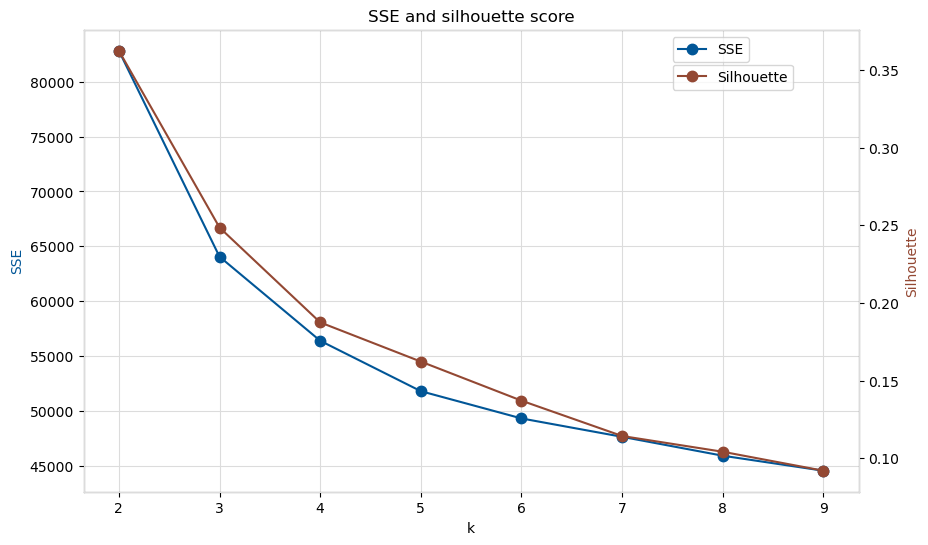

CPU times: user 46min 2s, sys: 27.7 s, total: 46min 30s
Wall time: 47min 22s


In [92]:
%%time

#from sklearn.metrics import silhouette_score
#from scipy.spatial.distance import pdist, squareform

n_clusters = range(2, 10)
sse_s = []
silhouette_s = []
#dist_mat = squareform(pdist(X_train, metric='euclidean'))

for n in tqdm(n_clusters):
    tskmeans = TimeSeriesKMeans(n_clusters=n)
    tskmeans.fit(X_scaled.values)
    sse_s.append(tskmeans.inertia_)
    score = silhouette_score(X_scaled, tskmeans.labels_)
    silhouette_s.append(score)

elbow_plot(sse_s, silhouette_s, figsize=(10,6), colors = ['#015697', '#934833'])

In [100]:
TSkmeans

<function __main__.TSkmeans(X, n_clusters)>

In [104]:
intervals = [4, 16, 64, 128, 256, 512]
clusters = []
tks = []
#    num_intervals = range(2, 250, 10)
for interval in intervals:

    approx_paa_s = df_paa(amp_s, num_intervals=interval)
    scaler = TabularToSeriesAdaptor(StandardScaler(), fit_in_transform=True)
    X_scaled = scaler.fit_transform(approx_paa_s.iloc[:, :-1])
 

    tk, score = TSkmeans(X_scaled.values, n_clusters=3)
    tks.append(tk)
    clusters.append(tk.labels_)

labels {0: 341, 1: 281, 2: 378}
sse 2266.2047299405685
silhouette 0.13891429943154673
labels {0: 320, 1: 348, 2: 332}
sse 11306.449332145285
silhouette 0.04205447210877901
labels {0: 288, 1: 363, 2: 349}
sse 50418.67206873474
silhouette 0.010813995105341749
labels {0: 7, 1: 901, 2: 92}
sse 70954.31181499391
silhouette -0.11574321647603278
labels {0: 479, 1: 521}
sse 224156.02908028243
silhouette 0.03247044253339533


KeyboardInterrupt: 

In [105]:
X_scaled

,0,1,2,3,4,5,6,7,8,9,...,502,503,504,505,506,507,508,509,510,511
0,0.581727,1.226169,0.225339,2.575338,3.679214,1.991131,0.605672,-1.640348,-0.929759,-0.470314,...,-1.616713,-2.027749,-1.879722,-0.221123,-0.867294,-0.840325,-0.853688,-0.674485,-1.581602,-1.971920
1,0.763977,0.503158,0.368347,1.020014,-0.127732,-0.264070,0.596638,1.809462,2.807233,2.575912,...,-0.343341,-1.169969,-0.713343,-0.358287,-0.383766,-0.447302,0.319450,0.352163,-0.164605,1.173229
2,-1.200533,-0.973802,-0.100615,2.096194,2.474861,0.977095,0.757428,0.592137,-1.454482,0.731406,...,-0.012368,-0.112309,0.040418,0.273483,0.395834,0.175295,-0.092222,-0.038189,0.118915,0.125963
3,0.286879,2.377191,3.359890,2.235482,0.316691,-0.005977,-0.141007,-0.115554,-0.286528,-0.401060,...,-0.432364,-0.929828,0.368310,2.673758,1.452246,2.530487,2.038641,0.918082,0.630723,0.386101
4,-1.055878,-0.707973,-0.306476,-0.523379,-0.880874,-0.454896,-0.627434,-0.588215,0.795999,0.766189,...,-1.256328,-0.217785,0.788660,0.455271,0.565389,-0.048047,0.060699,0.484989,0.614253,0.592579
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,-0.219961,-0.229403,-0.131456,0.304510,0.062278,-0.693449,-0.781101,-0.197043,0.158370,0.008562,...,1.091513,0.390214,0.137092,0.117078,0.284482,0.448414,0.470367,0.731112,0.631980,0.745243
996,-0.837680,-0.618777,-0.763762,-0.714749,-1.344974,-1.532791,-0.034023,-0.620661,-0.696991,-0.716147,...,0.129893,0.143395,0.653657,0.647411,0.841456,0.605336,0.593424,0.628462,0.756697,0.994667
997,-0.009651,-0.248531,-0.526635,-0.388762,-0.341743,1.354081,0.583069,-0.258770,-0.595021,-0.853921,...,-1.098865,-1.007092,-1.063938,-1.091165,-0.729742,-0.293009,-0.359850,-1.032632,0.578820,0.855904
998,0.077205,0.701909,1.010380,1.306527,0.953690,0.843581,1.271134,1.109282,1.239822,-0.332340,...,0.014560,1.128259,3.504672,4.765319,3.188411,0.487465,0.308750,0.625747,0.857604,0.398748


In [34]:
tskmeans = TimeSeriesKMeans(n_clusters=3)
tskmeans.fit(X_scaled.values)

TimeSeriesKMeans(n_clusters=3)

In [43]:
pca = PCA(n_components=2)
pca_data = pd.DataFrame(pca.fit_transform(df.iloc[:, :-2]), columns=['PC1', 'PC2'])

In [24]:
tsne = TSNE(n_components=2)
tsne_data = pd.DataFrame(tsne.fit_transform(approx_paa.iloc[:, :-1]), columns=['tSNE1', 'tSNE2'])

In [48]:
np.unique(tskmeans.labels_)

array([0, 2])

In [21]:
kmeans = TimeSeriesKMeans(n_clusters=4, metric='dtw', distance_params={'window':0.05}, n_init=1, max_iter=500)
kmeans.set_config(**{'backend:parallel': 'loky', 'n_jobs': -1})
kmeans.fit(X_scaled.values)

TimeSeriesKMeans(distance_params={'window': 0.05}, max_iter=500, n_clusters=4,
                 n_init=1)

In [59]:
np.unique(kmeans.labels_)

array([0, 1, 2])

In [62]:
intervals = [4, 16, 64, 128, 256, 512]

tks = []
#    num_intervals = range(2, 250, 10)
for interval in intervals:

    approx_paa_s = df_paa(amp_ts_s, num_intervals=interval)
    scaler = TabularToSeriesAdaptor(StandardScaler(), fit_in_transform=True)
    X_scaled = scaler.fit_transform(approx_paa_s.iloc[:, :-1])
 

    kmeans = TimeSeriesKMeans(n_clusters=4, metric='dtw', distance_params={'window':0.05}, n_init=1, max_iter=500)
    kmeans.set_config(**{'backend:parallel': 'loky', 'n_jobs': -1})
    kmeans.fit(X_scaled.values)
    tks.append(kmeans)

KeyboardInterrupt: 

In [63]:
tks

[TimeSeriesKMeans(distance_params={'window': 0.05}, max_iter=500, n_clusters=4,
                  n_init=1),
 TimeSeriesKMeans(distance_params={'window': 0.05}, max_iter=500, n_clusters=4,
                  n_init=1),
 TimeSeriesKMeans(distance_params={'window': 0.05}, max_iter=500, n_clusters=4,
                  n_init=1),
 TimeSeriesKMeans(distance_params={'window': 0.05}, max_iter=500, n_clusters=4,
                  n_init=1),
 TimeSeriesKMeans(distance_params={'window': 0.05}, max_iter=500, n_clusters=4,
                  n_init=1)]

In [85]:
len(kmeans.labels_)

10000

In [89]:
tsne_data

,tSNE1,tSNE2,clusters
0,-9.367778,-8.488970,3
1,-16.405884,-12.577330,3
2,-5.297771,13.785447,1
3,-12.605440,-29.035542,3
4,-15.417705,-11.344526,3
...,...,...,...
9995,29.137154,3.035165,0
9996,-1.022377,16.827021,1
9997,19.526360,4.047342,0
9998,22.461611,-7.459921,0


In [97]:
print(kmeans.labels_)

[3 3 1 ... 0 0 1]


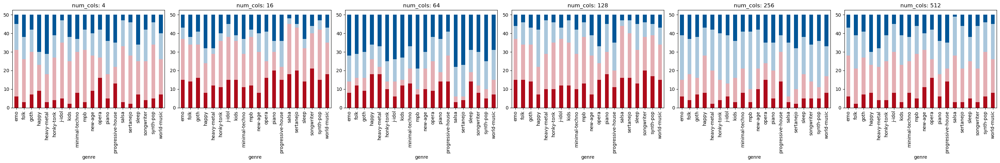

In [253]:
rows = 1 
cols = 6



fig, axes = plt.subplots(rows, cols, figsize=(30, 5))

for i, j in enumerate(intervals):
    ax = axes[i]  # Corrected from axs to axes

    sampled_amp['cluster'] = tks_amp[i].labels_

    pd.crosstab(sampled_amp['genre'], sampled_amp["cluster"]).plot(kind="bar", stacked=True, cmap=cmap, ax=ax, legend=False)
    # Inlier points
#    ax.scatter(inliers[:, 0], inliers[:, 1], label='Normal points', alpha=0.5, c='#015697')
    
    # Outlier points
#    ax.scatter(outliers[:, 0], outliers[:, 1], label='Outliers', alpha=0.6, c= '#ae0c1b')

#    ax.legend()
    #ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
    ax.set_title(f'num_cols: {j}')
    ax.set_xlabel('genre')
#""    ax.set_ylabel('PCA Component 2')

plt.tight_layout()
plt.show()

In [101]:
np.logspace(-3, 3, 2)

array([1.e-03, 1.e+03])

In [245]:
from sklearn.decomposition import PCA

In [246]:
pca = PCA(n_components=2)
pca_data = pd.DataFrame(pca.fit_transform(approx_paa_s_amp.iloc[:, :-3]), columns=['PC1', 'PC2'])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


IndexError: index 5 is out of bounds for axis 0 with size 5

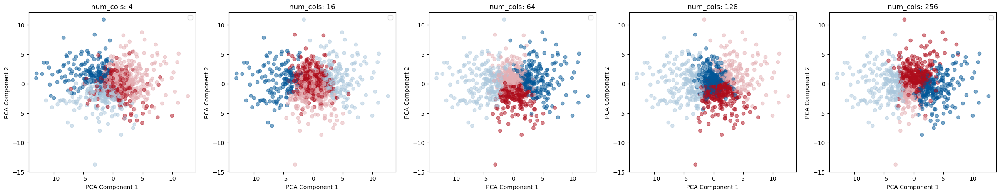

In [64]:
#dtw
rows = 1 
cols = 5



fig, axes = plt.subplots(rows, cols, figsize=(30, 5))

for i, j in enumerate(intervals):
    ax = axes[i]  # Corrected from axs to axes
    
#    mask = np.ones(X_pca.shape[0], dtype=bool)
#    mask[indices_out[i]] = False  # Mark outliers as False in the mask
    pca_data['clusters'] = tks[i].labels_

    ax.scatter(pca_data['PC1'], pca_data['PC2'], alpha = 0.5, c=pca_data['clusters'], cmap=cmap)
    # Inlier points
#    ax.scatter(inliers[:, 0], inliers[:, 1], label='Normal points', alpha=0.5, c='#015697')
    
    # Outlier points
#    ax.scatter(outliers[:, 0], outliers[:, 1], label='Outliers', alpha=0.6, c= '#ae0c1b')

    ax.legend()
    ax.set_title(f'num_cols: {j}')
    ax.set_xlabel('PCA Component 1')
    ax.set_ylabel('PCA Component 2')

plt.tight_layout()
plt.show()

In [74]:
colors

[(0.6823529411764706, 0.047058823529411764, 0.10588235294117647, 1.0),
 (0.8417993079584776, 0.5253979238754325, 0.5546943483275664, 1.0),
 (0.9960938100730489, 0.9974009996155325, 0.99840061514802, 1.0),
 (0.49610149942329873, 0.6647289504036908, 0.793679354094579, 1.0)]

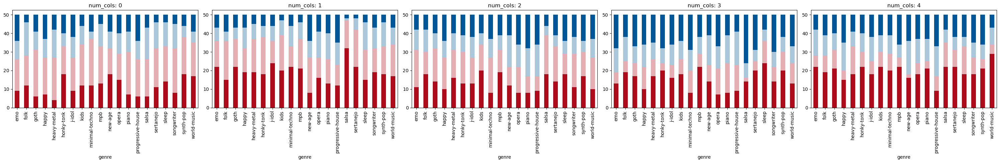

In [76]:
#dtw
rows = 1 
cols = 5



fig, axes = plt.subplots(rows, cols, figsize=(30, 5))

for i, j in enumerate(range(5)):
    ax = axes[i]  # Corrected from axs to axes

    amp_ts_s['cluster'] = tks[i].labels_

    pd.crosstab(amp_ts_s['genre'], amp_ts_s["cluster"]).plot(kind="bar", stacked=True, cmap=cmap, ax=ax, legend=False)
    # Inlier points
#    ax.scatter(inliers[:, 0], inliers[:, 1], label='Normal points', alpha=0.5, c='#015697')
    
    # Outlier points
#    ax.scatter(outliers[:, 0], outliers[:, 1], label='Outliers', alpha=0.6, c= '#ae0c1b')

#    ax.legend()
    #ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
    ax.set_title(f'num_cols: {j}')
    ax.set_xlabel('genre')
#""    ax.set_ylabel('PCA Component 2')

plt.tight_layout()
plt.show()

TypeError: 'int' object is not iterable

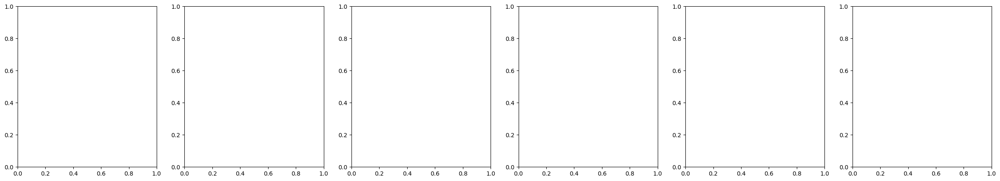

In [66]:
rows = 1 
cols = 6



fig, axes = plt.subplots(rows, cols, figsize=(30, 5))

for i, j in enumerate(intervals):
    ax = axes[i]  # Corrected from axs to axes
    
#    mask = np.ones(X_pca.shape[0], dtype=bool)
#    mask[indices_out[i]] = False  # Mark outliers as False in the mask
    pca_data['clusters'] = tks_amp[i].labels_

    ax.scatter(pca_data['PC1'], pca_data['PC2'], alpha = 0.5, c=pca_data['clusters'], cmap=cmap)
    # Inlier points
#    ax.scatter(inliers[:, 0], inliers[:, 1], label='Normal points', alpha=0.5, c='#015697')
    
    # Outlier points
#    ax.scatter(outliers[:, 0], outliers[:, 1], label='Outliers', alpha=0.6, c= '#ae0c1b')

    ax.legend()
    ax.set_title(f'num_cols: {j}')
    ax.set_xlabel('PCA Component 1')
    ax.set_ylabel('PCA Component 2')

plt.tight_layout()
plt.show()

In [ ]:
num_lines = len(tks)

plt.figure(figsize=(10, 5))
# Generate a color for each line using the colormap
colors = [cmap(i / num_lines) for i in range(num_lines)]

# Plot each array with a different color from the colormap
for i, j in enumerate(range(0, 25, 5)):
    plt.plot(np.squeeze(tks[j].cluster_centers_).T, color=colors[j], lw = 1, label=f'num_cols: {50*i + 2}')

    
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.title('Centroids distribution with different PAA')
plt.legend(by_label.values(), by_label.keys())
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


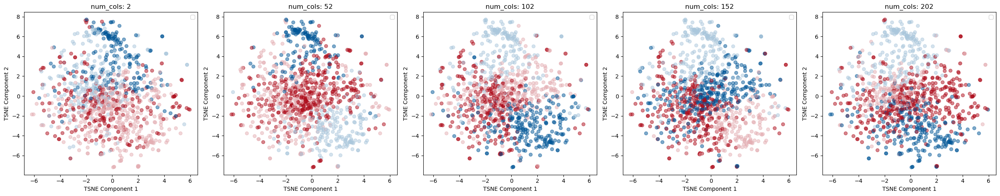

In [65]:


rows = 1 
cols = 5



fig, axes = plt.subplots(rows, cols, figsize=(25, 5))

for i, j in enumerate(range(5)):
    ax = axes[i]  # Corrected from axs to axes
    
#    mask = np.ones(X_pca.shape[0], dtype=bool)
#    mask[indices_out[i]] = False  # Mark outliers as False in the mask
    tsne_data['clusters'] = tks[j].labels_

    ax.scatter(tsne_data['tSNE1'], tsne_data['tSNE2'], alpha = 0.5, c=tsne_data['clusters'], cmap=cmap)
    # Inlier points
#    ax.scatter(inliers[:, 0], inliers[:, 1], label='Normal points', alpha=0.5, c='#015697')
    
    # Outlier points
#    ax.scatter(outliers[:, 0], outliers[:, 1], label='Outliers', alpha=0.6, c= '#ae0c1b')

    ax.legend()
    ax.set_title(f'num_cols: {50*i + 2}')
    ax.set_xlabel('TSNE Component 1')
    ax.set_ylabel('TSNE Component 2')

plt.tight_layout()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


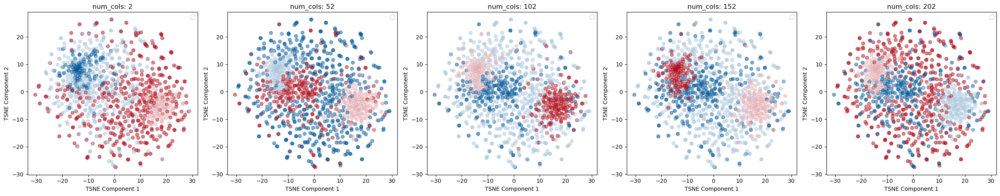

In [154]:
tsne = TSNE(n_components=2, random_state=42)

tsne_data = pd.DataFrame(tsne.fit_transform(sampled_amp.iloc[:, :-3]), columns=['tSNE1', 'tSNE2'])

rows = 1 
cols = 5



fig, axes = plt.subplots(rows, cols, figsize=(25, 5))

for i, j in enumerate(range(0, 25, 5)):
    ax = axes[i]  # Corrected from axs to axes
    
#    mask = np.ones(X_pca.shape[0], dtype=bool)
#    mask[indices_out[i]] = False  # Mark outliers as False in the mask
    tsne_data['clusters'] = tks_amp[j].labels_

    ax.scatter(tsne_data['tSNE1'], tsne_data['tSNE2'], alpha = 0.5, c=tsne_data['clusters'], cmap=cmap)
    # Inlier points
#    ax.scatter(inliers[:, 0], inliers[:, 1], label='Normal points', alpha=0.5, c='#015697')
    
    # Outlier points
#    ax.scatter(outliers[:, 0], outliers[:, 1], label='Outliers', alpha=0.6, c= '#ae0c1b')

    ax.legend()
    ax.set_title(f'num_cols: {50*i + 2}')
    ax.set_xlabel('TSNE Component 1')
    ax.set_ylabel('TSNE Component 2')

plt.tight_layout()
plt.show()

#### full data

In [259]:
X = approx_paa.iloc[:, :-1].values
dist_paa = squareform(pdist(X, metric='euclidean'))
tk, score = TSkmeans(X, n_clusters=4, dist=dist_paa)

labels {0: 2463, 1: 2084, 2: 4092, 3: 1361}
sse 95487.78789551779
silhouette 0.024940914113202775


In [262]:
pca_f = pd.DataFrame(pca.fit_transform(approx_paa.iloc[:, :-1]), columns=['PC1', 'PC2'])
pca_1280 = pd.DataFrame(pca.fit_transform(amp_ts.iloc[:, :-2]), columns=['PC1', 'PC2'])

In [269]:
tsne = TSNE(n_components=2, random_state=42)
tsne_f= pd.DataFrame(tsne.fit_transform(approx_paa.iloc[:, :-1]), columns=['tSNE1', 'tSNE2'])
tsne_1280 = pd.DataFrame(tsne.fit_transform(amp_ts.iloc[:, :-2]), columns=['tSNE1', 'tSNE2'])

In [290]:
tsne_1280 = pd.DataFrame(tsne.fit_transform(amp_ts.iloc[:, :-2]), columns=['tSNE1', 'tSNE2'])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


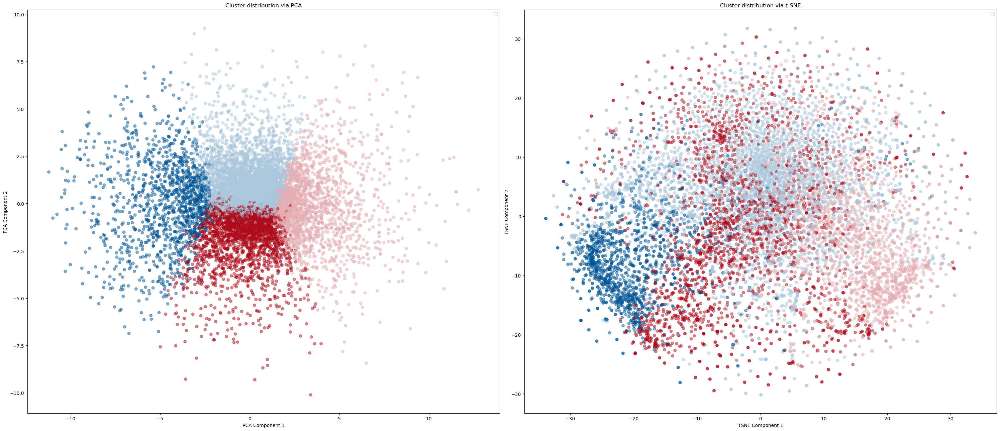

In [278]:

rows = 1 
cols = 2



fig, axes = plt.subplots(rows, cols, figsize=(30, 13))



ax = axes[0]  # Corrected from axs to axes
pca_f['clusters'] = tk.labels_

ax.scatter(pca_f['PC1'], pca_f['PC2'], alpha = 0.5, c=pca_f['clusters'], cmap=cmap)
# Inlier points
#    ax.scatter(inliers[:, 0], inliers[:, 1], label='Normal points', alpha=0.5, c='#015697')

# Outlier points
#    ax.scatter(outliers[:, 0], outliers[:, 1], label='Outliers', alpha=0.6, c= '#ae0c1b')

ax.legend()
ax.set_title(f'Cluster distribution via PCA')
ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')



ax = axes[1]  # Corrected from axs to axes
tsne_f['clusters'] = tk.labels_
ax.scatter(tsne_f['tSNE1'], tsne_f['tSNE2'], alpha = 0.5, c=tsne_f['clusters'], cmap=cmap)

ax.legend()
ax.set_title(f'Cluster distribution via t-SNE')
ax.set_xlabel('TSNE Component 1')
ax.set_ylabel('TSNE Component 2')

plt.tight_layout()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


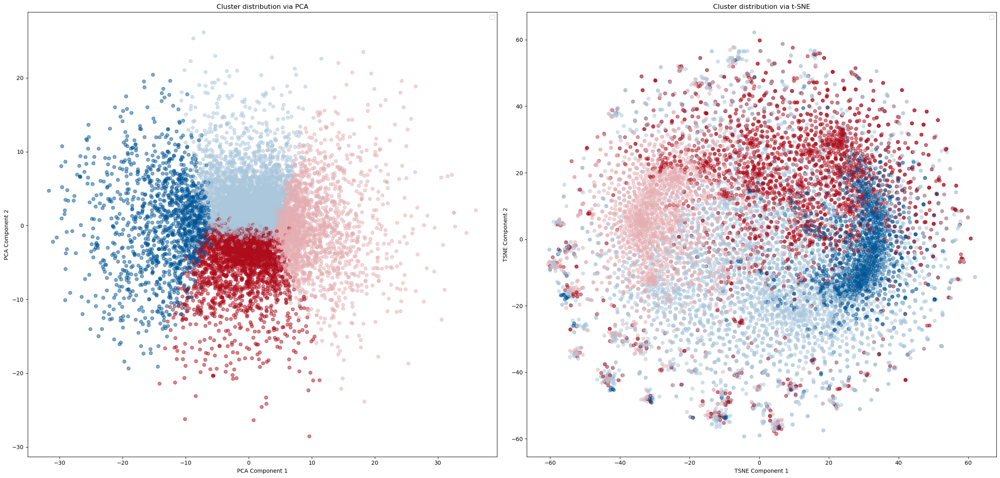

In [300]:
rows = 1 
cols = 2



fig, axes = plt.subplots(rows, cols, figsize=(25, 12))



ax = axes[0]  # Corrected from axs to axes
pca_1280['clusters'] = tk.labels_

ax.scatter(pca_1280['PC1'], pca_1280['PC2'], alpha = 0.5, c=pca_1280['clusters'], cmap=cmap)
# Inlier points
#    ax.scatter(inliers[:, 0], inliers[:, 1], label='Normal points', alpha=0.5, c='#015697')

# Outlier points
#    ax.scatter(outliers[:, 0], outliers[:, 1], label='Outliers', alpha=0.6, c= '#ae0c1b')

ax.legend()
ax.set_title(f'Cluster distribution via PCA')
ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')



ax = axes[1]  # Corrected from axs to axes
tsne_1280['clusters'] = tk.labels_
ax.scatter(tsne_1280['tSNE1'], tsne_1280['tSNE2'], alpha = 0.5, c=tsne_1280['clusters'], cmap=cmap)

ax.legend()
ax.set_title(f'Cluster distribution via t-SNE')
ax.set_xlabel('TSNE Component 1')
ax.set_ylabel('TSNE Component 2')

plt.tight_layout()
plt.show()

## Features-based Clustering

Custom Features Extraction

In [47]:
import scipy.stats as stats

In [48]:
def calculate_features(values):
    features = {
        'avg': np.mean(values),
        'std': np.std(values),
        'var': np.var(values),
        'med': np.median(values),
        '10p': np.percentile(values, 10),
        '25p': np.percentile(values, 25),
        '50p': np.percentile(values, 50),
        '75p': np.percentile(values, 75),
        '90p': np.percentile(values, 90),
        'iqr': np.percentile(values, 75) - np.percentile(values, 25),
        'cov': 1.0 * np.mean(values) / np.std(values),
        'skw': stats.skew(values),
        'kur': stats.kurtosis(values)
    }

    return features

In [51]:
X_train = df.iloc[:, :-3].values

In [52]:
X_train[0]

array([ 768.95392809,  828.02258438,  941.38630447, ..., 1442.91478617,
       1391.23601795, 1321.28390846])

In [53]:
X_train.shape[0]

10000

In [54]:
feature_values = [list(calculate_features(row).values()) for row in X_train]
index_values = list(range(0, X_train.shape[0]))
column_values = list(calculate_features(X_train[0]).keys())

CF_Train = pd.DataFrame(data = feature_values, index = index_values, columns = column_values) 
CF_Train

,avg,std,var,med,10p,25p,50p,75p,90p,iqr,cov,skw,kur
0,1658.266862,545.868186,2.979721e+05,1705.743998,936.291752,1216.487647,1705.743998,2017.645577,2188.327351,801.157930,3.037852,0.864605,2.725901
1,1669.254222,780.933865,6.098577e+05,1454.999030,824.377271,1038.218661,1454.999030,2204.715317,2824.541890,1166.496656,2.137510,0.756368,-0.182424
2,2275.563402,560.562805,3.142307e+05,2174.191941,1666.504309,1944.966265,2174.191941,2537.964940,2950.797439,592.998675,4.059426,1.254355,3.327199
3,1373.101158,291.797356,8.514570e+04,1376.659276,973.473765,1136.339645,1376.659276,1611.195935,1743.512440,474.856290,4.705667,-0.133215,-0.796690
4,1677.731838,657.591959,4.324272e+05,1615.922243,875.517970,1170.116290,1615.922243,2124.239824,2566.467309,954.123534,2.551327,0.596348,0.094432
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2865.031474,196.149800,3.847474e+04,2848.507875,2635.314377,2742.304977,2848.507875,2978.519231,3084.109559,236.214254,14.606344,0.998233,3.876414
9996,2424.652610,593.710761,3.524925e+05,2396.486624,1716.908331,2070.207746,2396.486624,2710.449607,3009.571398,640.241861,4.083895,1.026972,2.879674
9997,2807.977765,1108.559827,1.228905e+06,2809.585702,1374.311797,2208.333441,2809.585702,3473.206748,4027.800450,1264.873307,2.532996,0.048452,0.300758
9998,2909.581274,1277.046567,1.630848e+06,2807.130513,1442.937004,1916.001806,2807.130513,3675.685844,4592.425634,1759.684038,2.278367,0.626293,0.292361


In [55]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_std = scaler.fit_transform(CF_Train)
dist_cf = squareform(pdist(X_std, metric='euclidean'))

In [56]:
X_std = pd.DataFrame(X_std)

100%|███████████████████████████████████████████| 13/13 [06:41<00:00, 30.91s/it]


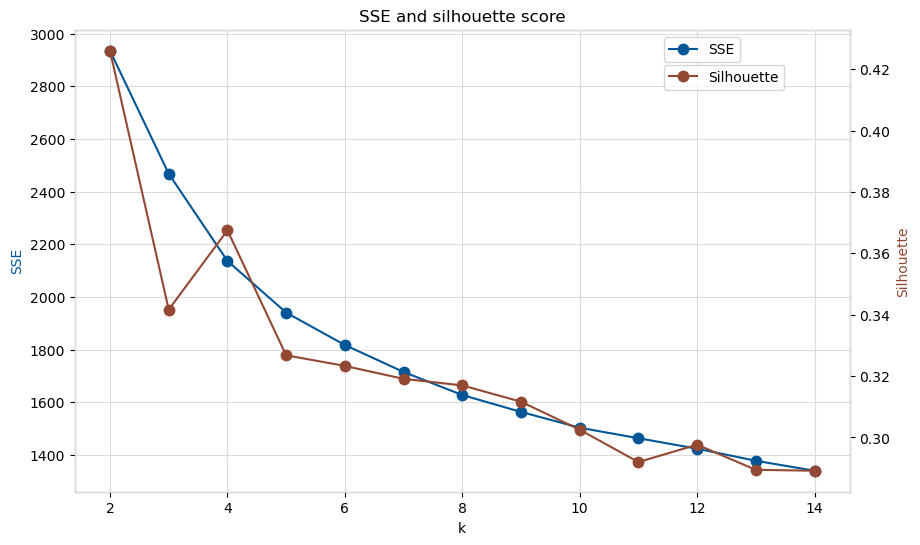

CPU times: user 6min 38s, sys: 1.99 s, total: 6min 40s
Wall time: 6min 41s


In [399]:
%%time

#from sklearn.metrics import silhouette_score
#from scipy.spatial.distance import pdist, squareform

n_clusters = range(2, 15)
sse_cf = []
silhouette_cf = []
#dist_mat = squareform(pdist(X_train, metric='euclidean'))

for n in tqdm(n_clusters):
    tskmeans = TimeSeriesKMeans(n_clusters=n, metric="euclidean")
    tskmeans.fit(X_minmax.values)
    sse_cf.append(tskmeans.inertia_)
    score = silhouette_score(dist_cf, tskmeans.labels_, metric="precomputed")
    silhouette_cf.append(score)

elbow_plot(sse_cf, silhouette_cf, figsize=(10,6), colors = ['#015697', '#934833'])

In [172]:
df['cluster_cf'] = tskmenas_cf.labels_

Text(0.5, 1.0, 'feature-based')

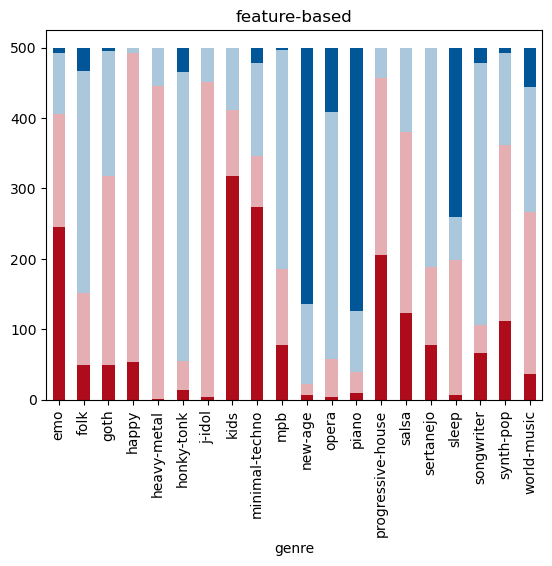

In [173]:
pd.crosstab(df['genre'], df["cluster_cf"]).plot(kind="bar", stacked=True, cmap=cmap, legend=False)
plt.title('feature-based')

Text(0.5, 1.0, 'K-Means using DTW')

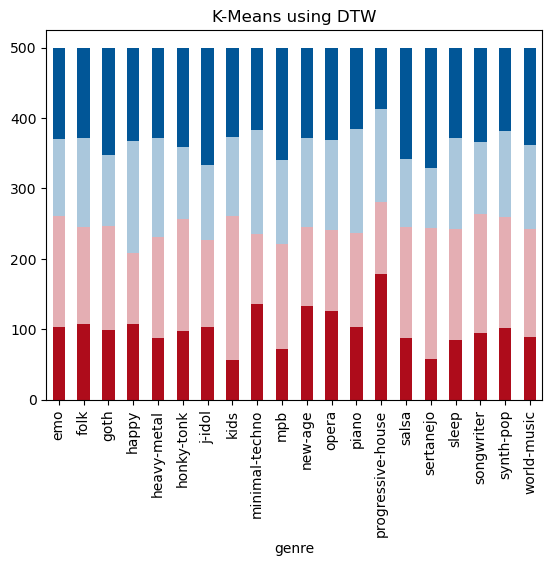

In [67]:
df['cluster_cf'] = kmeans.labels_

pd.crosstab(df['genre'], df["cluster_cf"]).plot(kind="bar", stacked=True, cmap=cmap, legend=False)
plt.title('K-Means using DTW')